In [11]:
import os
import glob
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import nibabel as nib
import nilearn
from nltools.file_reader import onsets_to_dm
from nltools.stats import regress, zscore
from nltools.data import Brain_Data, Design_Matrix
from nltools.stats import find_spikes 
from nilearn.plotting import view_img, glass_brain, plot_stat_map
from bids import BIDSLayout, BIDSValidator
from nilearn.image import concat_imgs, mean_img
from nilearn import plotting

ModuleNotFoundError: No module named 'bids'

In [10]:
#pip install nltools
pip install -U --user bids

SyntaxError: invalid syntax (<ipython-input-10-8c4c8e49501f>, line 2)

400


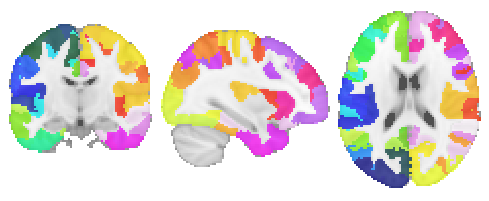

In [2]:
from nilearn import datasets

# Get parcellation atlas from nilearn
atlas_file = datasets.fetch_atlas_schaefer_2018(n_rois=400, yeo_networks=17, resolution_mm=2)

# Visualize parcellation atlas
atlas_maps = atlas_file.maps
plotting.plot_roi(atlas_maps, draw_cross=False, annotate=False)

# Get atlas labels
atlas_labels = atlas_file.labels
print(len(atlas_labels))

In [3]:
atlas_labels[0:10]

array([b'17Networks_LH_VisCent_ExStr_1', b'17Networks_LH_VisCent_ExStr_2',
       b'17Networks_LH_VisCent_ExStr_3', b'17Networks_LH_VisCent_ExStr_4',
       b'17Networks_LH_VisCent_ExStr_5', b'17Networks_LH_VisCent_ExStr_6',
       b'17Networks_LH_VisCent_Striate_1',
       b'17Networks_LH_VisCent_ExStr_7', b'17Networks_LH_VisCent_ExStr_8',
       b'17Networks_LH_VisCent_ExStr_9'], dtype='|S36')

# Cond1 (low interference, easy search)

In [4]:
# Get some participant (102) data
s102_path = 'DistractWM/sub-102/cond1_beta-series/sub-102_task-DistractWM_contrast-cond1_space-MNI152_Schaefer_Resample.nii.gz'
s102_c1_data = nib.load(s102_path) 
s102_c1_data.shape

FileNotFoundError: No such file or no access: 'DistractWM/sub-102/cond1_beta-series/sub-102_task-DistractWM_contrast-cond1_space-MNI152_Schaefer_Resample.nii.gz'

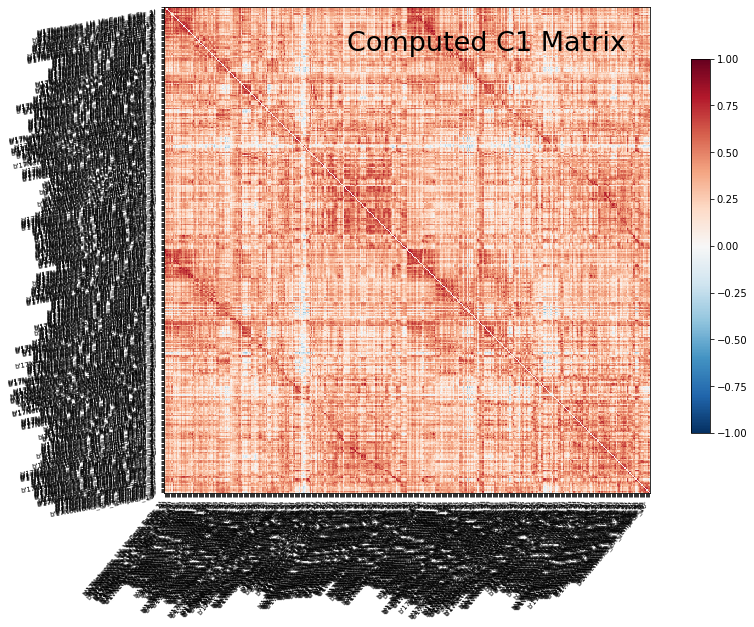

In [34]:
from nilearn.input_data import NiftiLabelsMasker
from nilearn.connectome import ConnectivityMeasure

# ConenctivityMeasure from Nilearn uses simple 'correlation' to compute connectivity matrices 
connectome_measure = ConnectivityMeasure(kind='correlation')

# Create masker to extract functional data within atlas parcels
masker = NiftiLabelsMasker(labels_img=atlas_maps, standardize=True, memory='nilearn_cache')

# Get timeseries
time_series = masker.fit_transform(s102_path)

# Calculate correlation matrix for participant
correlation_matrix = connectome_measure.fit_transform([time_series])[0] 
np.fill_diagonal(correlation_matrix, 0)    

# Plot correlating matrix
plotting.plot_matrix(correlation_matrix, labels=atlas_labels,
                     figure=(10, 10), vmax=1, vmin=-1,
                     title='Computed C1 Matrix')

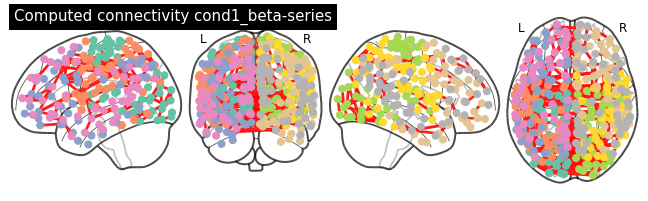

In [31]:
# Mean correlation matrix across 1 subject 
mean_correlation_matrix = connectome_measure.mean_

# Grab coordinates for atlas labels
coordinates, c_labels = plotting.find_parcellation_cut_coords(labels_img=atlas_maps, return_label_names=True)

# Plot connectome with 99.5% edge strength in the connectivity
plotting.plot_connectome(mean_correlation_matrix, coordinates,
                         edge_threshold="99.5%",
                         display_mode='lyrz',
                         title='Computed connectivity cond1_beta-series')

In [9]:
# Plot interactive connectome
view = plotting.view_connectome(mean_correlation_matrix, coordinates, edge_threshold='99.5%')
view

### Already processed data for cond1_beta-series

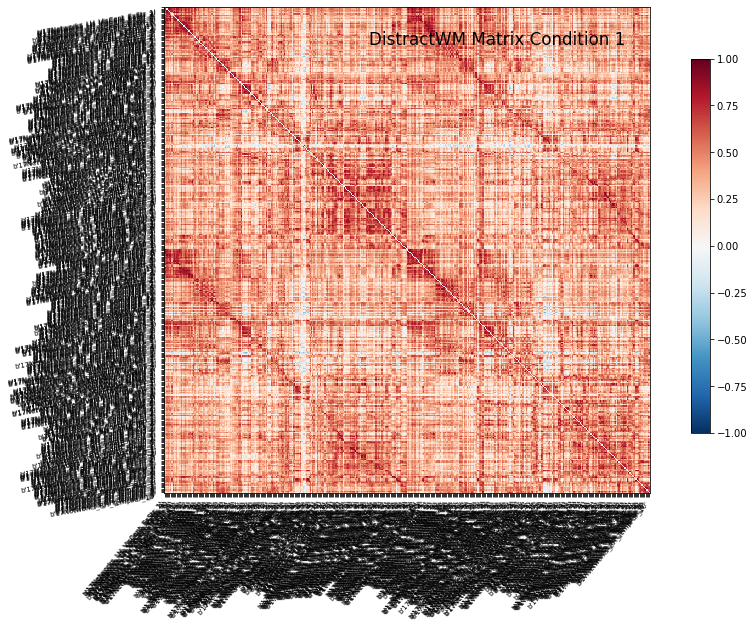

In [6]:
# Check if computed matrix is equal to matrix provided by Distract_WM

D_WM_matrix = np.load('DistractWM/sub-102/graph_metrics/matrix_cond1_space.npy')

plotting.plot_matrix(D_WM_matrix, labels=atlas_labels,
                     figure=(10, 10), vmax=1, vmin=-1,
                     title='DistractWM Matrix Condition 1')


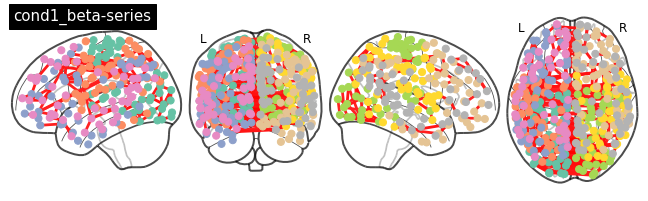

In [30]:
# Mean correlation matrix across 1 subject 
mean_correlation_matrix = connectome_measure.mean_

# Grab coordinates for atlas labels
coordinates, c_labels = plotting.find_parcellation_cut_coords(labels_img=atlas_maps, return_label_names=True)

# Plot connectome with 99.5% edge strength in the connectivity
plotting.plot_connectome(mean_correlation_matrix, coordinates,
                         edge_threshold="99.5%",
                         display_mode='lyrz',
                         title='cond1_beta-series')


In [18]:
view = plotting.view_connectome(correlation_matrices, coordinates, edge_threshold='99.5%')

view

### Comparing 'computed c1 matrix' and c1 matrix

In [71]:
# Reshape each matrix into a 1d array
computed_matrix_2_array = correlation_matrix.flatten() 
D_WM_matrix_2_array = D_WM_matrix.flatten() 

# Place each array into a panda dataframe (table)
compare_c1_matrices = pd.DataFrame([computed_matrix_2_array.T, D_WM_matrix_2_array.T])
compare_c1_matrices = compare_c1_matrices.T
compare_c1_matrices.columns = ['Computed values', 'True/Given values']

compare_c1_matrices.head(20)


,Computed values,True/Given values
0,0.000000,0.000000
1,0.746705,0.867219
2,0.711752,0.826625
3,0.591300,0.686732
4,0.590114,0.685355
5,0.703012,0.816474
6,0.399626,0.464123
7,0.657760,0.763919
8,0.634341,0.736720
9,0.614135,0.713253


In [25]:
from sklearn.metrics import mean_squared_error

# Calculate error for computed c1 matrix
# Compute sum mean squared error

c1_error = mean_squared_error(D_WM_matrix_2_array, computed_matrix_2_array)

print('The mean squared error for the c1 computed matrix is: ' + str(c1_error))


The mean squared error for the c1 computed matrix is: 0.0034677103736949918


# Cond2 (low interference, hard search)

# Cond3 (high interference, easy search)

# Cond4 (high interference, hard search)


In [64]:
atlas_labels[:25]
#atlas_labels[]

print(atlas_file.keys())

print(type(atlas_labels))
print(atlas_labels.shape)
print(type(atlas_maps))


atlas_labels[0]

dict_keys(['maps', 'labels', 'description'])
<class 'numpy.ndarray'>
(400,)
<class 'str'>


b'17Networks_LH_VisCent_ExStr_1'

In [112]:
print(coordinates[0])
print(coordinates[0][0])
print(coordinates[0][1])
print(coordinates[0][2])

x_coords = np.zeros(400) 
y_coords = np.zeros(400) 
z_coords = np.zeros(400) 

for x in range(400):
    
    x_coords[x] = coordinates[x][0]
    y_coords[x] = coordinates[x][1]
    z_coords[x] = coordinates[x][2]
    
x_coords = x_coords.reshape(400, 1)
y_coords = y_coords.reshape(400, 1)
z_coords = z_coords.reshape(400, 1)

[-35.36569579 -62.03236246 -17.05501618]
-35.36569579288026
-62.032362459546924
-17.055016181229774


In [124]:

map_info = pd.DataFrame([atlas_labels.reshape(400)])
map_info = map_info.T
map_info.columns=['Regions']

map_info['x_coords'] = x_coords
map_info['y_coords'] = y_coords
map_info['z_coords'] = z_coords

map_info.head(15)

,Regions,x_coords,y_coords,z_coords
0,b'17Networks_LH_VisCent_ExStr_1',-35.365696,-62.032362,-17.055016
1,b'17Networks_LH_VisCent_ExStr_2',-23.350588,-72.696471,-10.296471
2,b'17Networks_LH_VisCent_ExStr_3',-36.414566,-81.389356,-15.966387
3,b'17Networks_LH_VisCent_ExStr_4',-16.950000,-86.387500,-14.987500
4,b'17Networks_LH_VisCent_ExStr_5',-24.406780,-96.745763,-11.924670
5,b'17Networks_LH_VisCent_ExStr_6',-41.553846,-86.430769,-3.256410
6,b'17Networks_LH_VisCent_Striate_1',-7.691383,-97.450902,-7.250501
7,b'17Networks_LH_VisCent_ExStr_7',-46.149533,-73.074766,6.135514
8,b'17Networks_LH_VisCent_ExStr_8',-24.431239,-95.874363,5.925297
9,b'17Networks_LH_VisCent_ExStr_9',-39.389771,-83.760141,14.130511


In [123]:
map_info[map_info.Regions == 'VisCent']

,Regions,x_coords,y_coords,z_coords


In [131]:
coordinates

array([[-35.36569579, -62.03236246, -17.05501618],
       [-23.35058824, -72.69647059, -10.29647059],
       [-36.41456583, -81.38935574, -15.96638655],
       ...,
       [ 64.3852459 , -34.36885246,  10.54098361],
       [ 54.52307692, -45.67179487,  19.75384615],
       [ 61.21111111, -39.73333333,  21.75555556]])

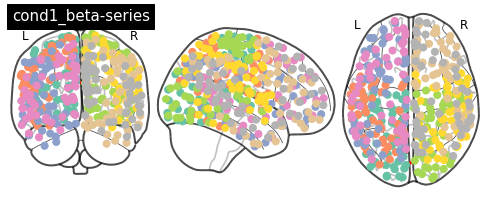

In [135]:
# grab center coordinates for atlas labels
coordinates, c_labels = plotting.find_parcellation_cut_coords(labels_img=atlas_maps, return_label_names=True)

# plot connectome with 80% edge strength in the connectivity
plotting.plot_connectome(D_WM_matrix, coordinates,
                         edge_threshold="99.999%",
                         annotate=True,
                         title='cond1_beta-series')

In [138]:
view = plotting.view_connectome(D_WM_matrix, coordinates, edge_threshold='99.9%')

view

In [29]:
parcels = nib.load('DistractWM/Schaefer2018_400Parcels_17Networks_order_FSLMNI152_2mm_LPI.nii.gz').get_data()
assert parcels.shape == (91, 109, 91) 
n_nodes = int(np.nanmax(parcels))
n_nodes


<ipython-input-29-282b036738c3>:1: DeprecationWarning: get_data() is deprecated in favor of get_fdata(), which has a more predictable return type. To obtain get_data() behavior going forward, use numpy.asanyarray(img.dataobj).

* deprecated from version: 3.0
* Will raise <class 'nibabel.deprecator.ExpiredDeprecationError'> as of version: 5.0
  parcels = nib.load('DistractWM/Schaefer2018_400Parcels_17Networks_order_FSLMNI152_2mm_LPI.nii.gz').get_data()


400

<ipython-input-59-db118315c09a>:2: DeprecationWarning: get_data() is deprecated in favor of get_fdata(), which has a more predictable return type. To obtain get_data() behavior going forward, use numpy.asanyarray(img.dataobj).

* deprecated from version: 3.0
* Will raise <class 'nibabel.deprecator.ExpiredDeprecationError'> as of version: 5.0
  s1_data = nib.load(s102_path).get_data()


(91, 109, 91, 48)
(91, 109, 91)
400


<ipython-input-59-db118315c09a>:4: DeprecationWarning: get_data() is deprecated in favor of get_fdata(), which has a more predictable return type. To obtain get_data() behavior going forward, use numpy.asanyarray(img.dataobj).

* deprecated from version: 3.0
* Will raise <class 'nibabel.deprecator.ExpiredDeprecationError'> as of version: 5.0
  parcels = nib.load('DistractWM/Schaefer2018_400Parcels_17Networks_order_FSLMNI152_2mm_LPI.nii.gz').get_data()


(400, 48)
(400, 400)
(400, 400)


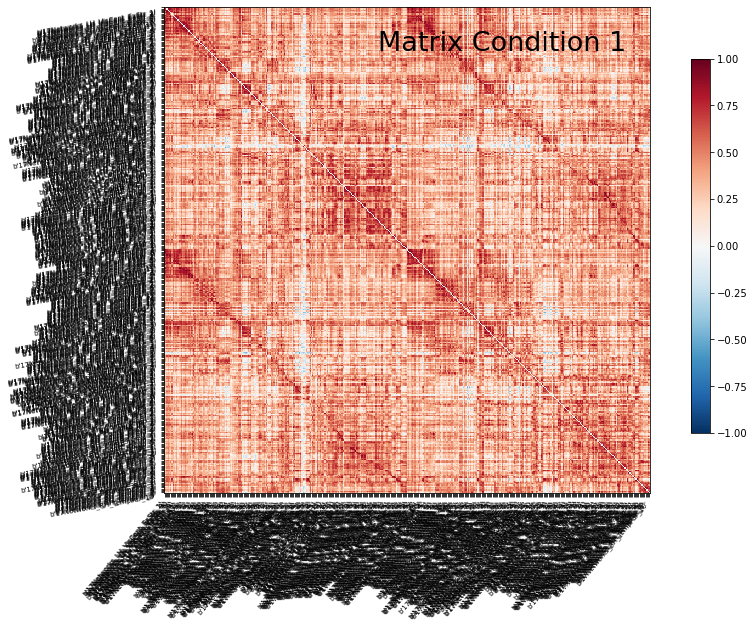

In [59]:
# Load fmri data
s1_data = nib.load(s102_path).get_data()
print(s1_data.shape)

# Load parcell
parcels = nib.load('DistractWM/Schaefer2018_400Parcels_17Networks_order_FSLMNI152_2mm_LPI.nii.gz').get_data()
print(parcels.shape)

# Get number of nodes '400'
n_nodes = int(np.nanmax(parcels))
print(n_nodes)

# Create matrix (400, 48)
matrix = np.zeros((n_nodes, s1_data.shape[-1]))

# Run to 400
# Assign to matrix[p] (1-400), the mean (ignoring nans) of fmri data index  
for p in np.arange(0, n_nodes): matrix[p] = np.nanmean(s1_data[parcels==p+1],axis=0) 

print(matrix.shape)

matrix = np.corrcoef(matrix)
print(matrix.shape)

matrix = np.triu(matrix,1) +  np.triu(matrix,1).transpose()
print(matrix.shape)

plotting.plot_matrix(matrix, labels=atlas_labels,
                     figure=(10, 10), vmax=1, vmin=-1,
                     title='Matrix Condition 1')

#coverage = np.nanmax(matrix,axis=1)
#coverage = np.where(np.isnan(coverage)==False)[0]
#print (len(coverage))



#

In [63]:
print(matrix.flatten()[0:20]) 

[0.         0.8672188  0.82662484 0.68673245 0.68535526 0.81647402
 0.46412265 0.7639185  0.7367196  0.71325312 0.74305974 0.80732808
 0.85891907 0.84374727 0.76599291 0.67299188 0.7021978  0.72862847
 0.76535932 0.60699816]


In [40]:
matrix[0, :]

array([ 3.42806864,  1.81589544,  3.89213729,  0.81199259,  1.313622  ,
        0.84339929,  4.42102814,  2.34874701,  0.84806097,  1.62325931,
        4.87320948,  4.5444541 ,  3.02885079,  2.00677299,  2.22728157,
        3.75893569,  2.96870303,  2.87561274, -2.1422925 ,  3.10349846,
       -0.52522349,  1.65062284,  3.15428567,  2.78912973,  1.55490136,
       -2.13412523, -1.15652382,  4.84316206,  0.97414136, -0.19344664,
       -0.39623857,  1.45180058,  2.95983839, -1.32313764, -0.01913609,
        1.57647336,  0.73990923,  1.25917745,  1.53805745,  3.54451418,
        2.98909259,  0.77077317,  1.63992858,  1.58070314, -0.38162801,
        2.32624292,  0.33149162,  6.34589291])

In [53]:
#i[parcels==p+1]
s1_data[parcels==1].shape

(309, 48)

In [64]:
[parcels==1]

[array([[[False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False],
         ...,
         [False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False]],
 
        [[False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False],
         ...,
         [False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False]],
 
        [[False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False],
         ...,
         [False, False, False, ..., False, False, False],
         [False, False, 

In [66]:
t_matrix = np.triu(correlation_matrix,1) +  np.triu(correlation_matrix,1).transpose()
print(t_matrix.shape)
t_matrix[0, :]



(400, 400)


array([ 0.        ,  0.7467053 ,  0.71175224,  0.59130025,  0.5901145 ,
        0.7030122 ,  0.39962554,  0.65776014,  0.6343408 ,  0.61413544,
        0.63980013,  0.6951372 ,  0.739559  ,  0.72649544,  0.6595462 ,
        0.5794693 ,  0.6046165 ,  0.62737423,  0.65900075,  0.52264625,
        0.62179345,  0.45404714,  0.5654573 ,  0.42044434,  0.23135374,
        0.58825886,  0.49445686,  0.42775872,  0.5016484 ,  0.33883438,
        0.27660403,  0.21436036,  0.5046114 ,  0.50491303,  0.34617832,
        0.32530951,  0.4867897 ,  0.2914239 ,  0.37315905,  0.3083615 ,
        0.4542691 ,  0.18592378,  0.49220008,  0.48218358,  0.4297663 ,
        0.4451604 ,  0.36574548,  0.33109936,  0.27685034,  0.3750482 ,
        0.20811318,  0.29952794,  0.18627562,  0.21271712,  0.297147  ,
        0.30614078,  0.31970605,  0.4662226 ,  0.44538155,  0.52794796,
        0.62299794,  0.43974525,  0.61189693,  0.37947202,  0.6011299 ,
        0.49865797,  0.49260822,  0.44361797,  0.43607652,  0.46